In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from PIL import Image, ImageDraw

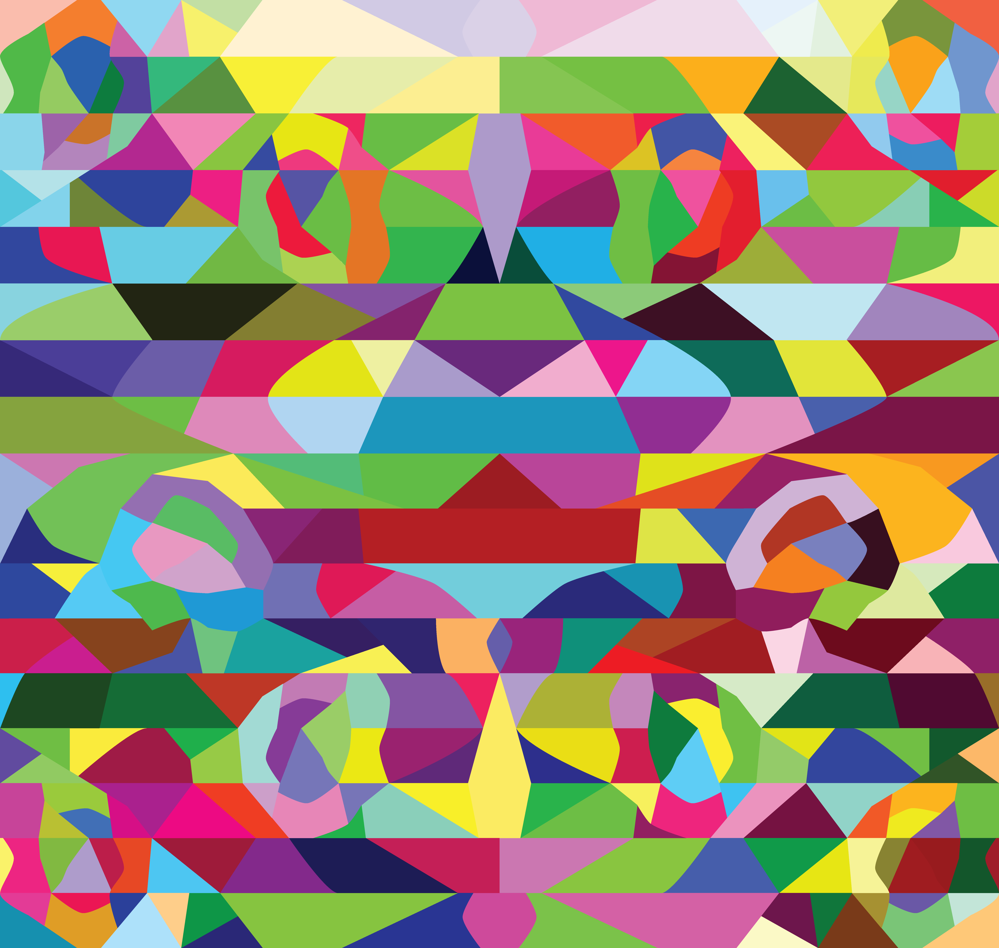

In [98]:
design = Image.open("../assets/glass/glass-ids.png")
display(design)

In [99]:
h = design.height
w = design.width

In [100]:
segments = 17
led_across = 141
led_up = 9

# Y position of each segment in design pixels from top, since they aren't all exactly
# the same :(
segment_spacings = [
    0,
    389,
    776,
    1166,
    1553,
    1941,
    2328,
    2717,
    3104,
    3478,
    3858,
    4235,
    4609,
    4986,
    5362,
    5738,
    6115
]

In [101]:
for x,y in zip(segment_spacings[:-1], segment_spacings[1:]):
        print(y-x)

389
387
390
387
388
387
389
387
374
380
377
374
377
376
376
377


In [102]:
segment_spacing = h / segments
across_spacing = w / led_across
up_spacing = segment_spacing / led_up

In [103]:
colors = design.getcolors(maxcolors=100000)
len(colors)

330

In [165]:
# Indexed from top left corner
# Probably need to do some flipping to match the model
# TODO: we aren't adapting up_spacing to the width of each segment

led_coord = []
first_coord = []

ids = {}
neighbours = {}

def addn(poly, targets):
    color = design.getpixel(poly)
    
    if color not in neighbours:
        neighbours[color] = set()
                
    for neighbour in targets:
        x, y = neighbour
        
        if x < 0 or x > w:
            continue
            
        if y < 0 or y > h:
            continue
                        
        neighbours[color].add(design.getpixel(neighbour))
    
for seg, space in enumerate(segment_spacings):
    x = across_spacing / 2.0
    y = up_spacing / 2.0 + space
    
    sign = 1
    
    if seg >= 8:
        # We're now on the front side, put the origin in the right place
        sign = -1
        y = segment_spacings[seg+1] if seg < len(segment_spacings)-1 else h
        y -= up_spacing / 2.0
    
    first_coord.append((x,y))

    # Left to right
    for i in range(led_across):
        led_coord.append((x,y))
        addn((x,y), [(x - across_spacing, y), (x + across_spacing, y), (x, y + (up_spacing-1) * led_up * sign)])
        x += across_spacing

    # Down
    x -= across_spacing*0.75
    for i in range(led_up):
        led_coord.append((x,y))
        y += up_spacing * sign
        
    # Right to left
    x -= across_spacing*0.25
    y -= up_spacing * sign
    for i in range(led_across):
        led_coord.append((x,y))
        addn((x,y), [(x - across_spacing, y), (x + across_spacing, y), (x, y - (up_spacing-1) * led_up * sign)])
        x -= across_spacing
        
    # Up
    x += across_spacing*0.75
    for i in range(led_up):
        led_coord.append((x, y))
        y -= up_spacing * sign
        

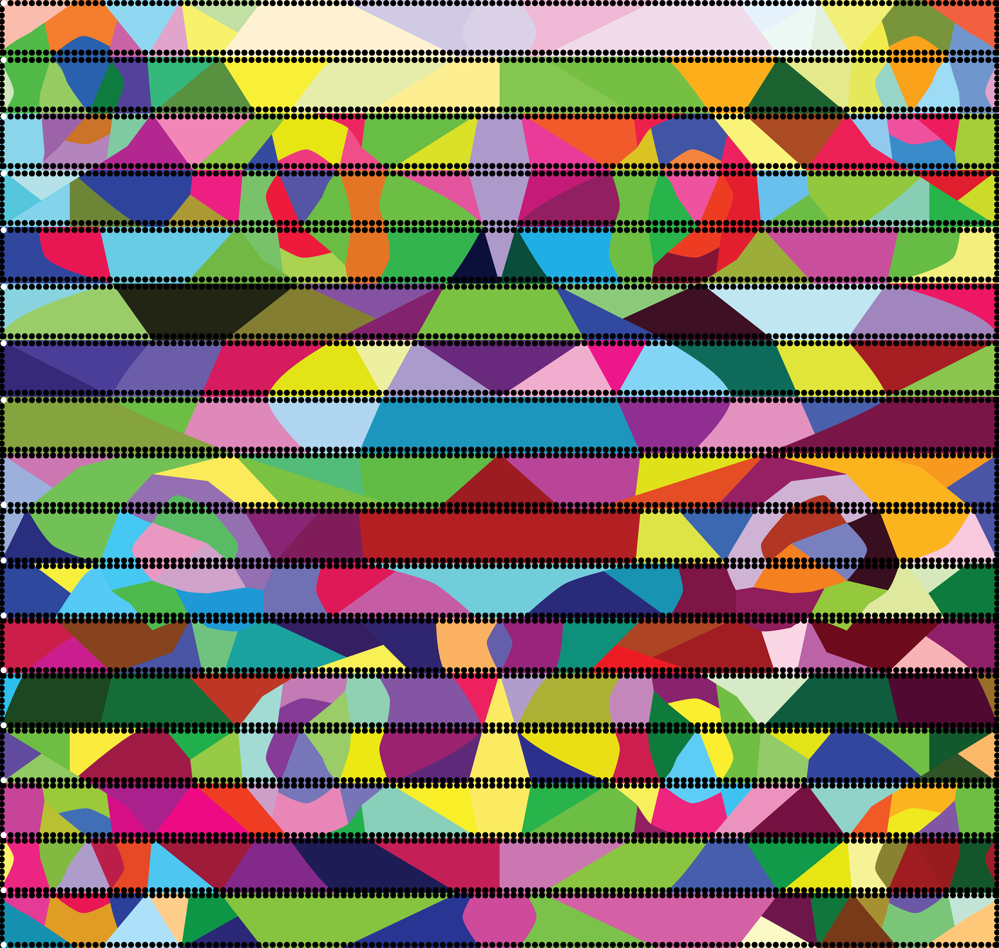

In [136]:
leds = Image.new(design.mode, (design.width, design.height), color=(0,0,0,0))
draw = ImageDraw.Draw(leds)


for x,y in led_coord:
    draw.ellipse([x-20, y-20, x+20, y+20], fill=(0,0,0))

for x,y in first_coord:
    draw.ellipse([x-20, y-20, x+20, y+20], fill=(255,255,255))
    
display(Image.alpha_composite(design, leds))

In [166]:
# Dicts are now ordered, so polygon ids should be in
# approximately left-right, top-bottom order.

ids = {}

for i, (x,y) in enumerate(led_coord):
    color = design.getpixel((x,y))
    if color not in ids:
        ids[color] = list()
    
    ids[color].append(i)

In [167]:
neighbour_ids = []
ids_keys = [x for x in ids.keys()]

for i, (k, v) in enumerate(neighbours.items()): 
    polys = list()
    for neighbour in v:
        index = ids_keys.index(neighbour)
        
        # Avoid loops
        if index != i: 
            polys.append(index)
        
    neighbour_ids.append(polys)

In [168]:
neighbour_ids

[[1, 22, 21],
 [21, 22, 0, 2],
 [21, 24, 25, 1, 20, 3],
 [25, 15, 4, 19, 2],
 [26, 25, 5, 3],
 [26, 6, 4, 19, 27],
 [28, 5, 7, 27],
 [28, 29, 6, 8],
 [29, 9, 7, 30],
 [18, 8, 10, 30, 31],
 [11, 9, 33, 31],
 [18, 12, 33, 10],
 [11, 34, 33, 17, 13, 16],
 [15, 14, 12, 16],
 [16, 15, 13],
 [61, 35, 60, 13, 3],
 [35, 60, 34, 17, 59, 13, 36],
 [16, 12],
 [9, 11],
 [5, 3],
 [2, 21],
 [42, 24, 23, 1, 38, 20, 41],
 [23, 1, 40, 39, 41],
 [41, 22, 21],
 [21, 25, 38, 20, 43],
 [24, 26, 44, 45, 37, 3],
 [25, 45, 5, 47, 46, 27, 48, 37],
 [26, 28, 49, 5, 48],
 [29, 50, 49, 6, 5, 51, 7, 27],
 [28, 51, 9, 8, 7, 30, 52, 66],
 [29, 53, 9, 52, 31],
 [55, 56, 9, 30, 54, 53, 32],
 [56, 11, 18, 9, 33, 31],
 [56, 11, 34, 32],
 [33, 17, 36, 16, 58],
 [60, 16, 15],
 [16, 17, 34],
 [26, 25, 5, 19, 3],
 [24, 21, 20],
 [22],
 [23, 72, 22, 39, 70, 41],
 [42, 40, 72],
 [73, 72, 41, 43],
 [42, 44, 73],
 [24, 25, 73, 45, 38, 37, 70, 43],
 [44, 73, 75, 46, 74, 37],
 [82, 315, 76, 69, 45, 47, 295, 75, 79, 37, 294],
 [27

# Debug small polygons

If a poly has very few LEDs in it there's either something wrong with the algorithm, or something in the design that likely won't work.

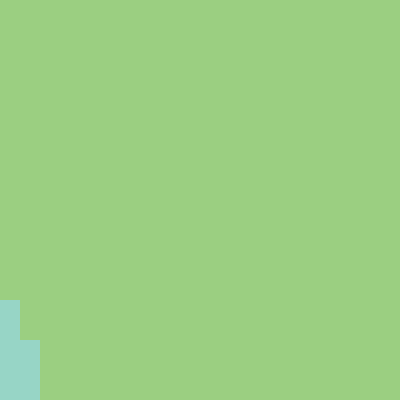

In [92]:
x, y = single_points[0]
left = (x-10, y-10)
right = (x+10, y+10)

display(design.crop((*left, *right)).resize((400,400), Image.NEAREST))

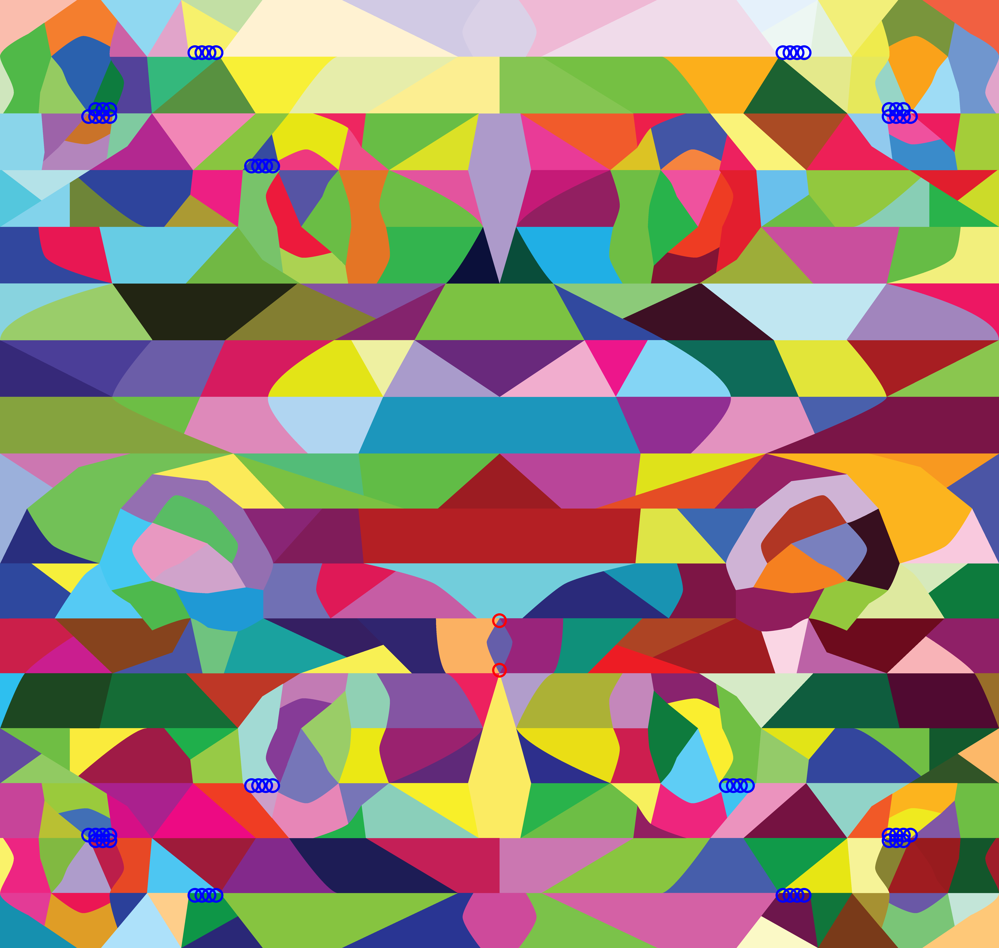

In [112]:
single_points = []
ids_values = [x for x in ids.values()]

for i, values in enumerate(ids.values()):
    if len(values) == 1:
        single_points.append(led_coord[values[0]])
        
leds = Image.new(design.mode, (design.width, design.height), color=(0,0,0,0))
draw = ImageDraw.Draw(leds)


# for x,y in led_coord:
#     draw.ellipse([x-20, y-20, x+20, y+20], fill=(0,0,0))
#     draw.ellipse([x-20, y-20, x+20, y+20], fill=(0,0,0))    

# for x,y in single_points:
#     draw.ellipse([x-50, y-50, x+50, y+50], outline="red", width=15)
#     draw.ellipse([x-20, y-20, x+20, y+20], outline="red") 

for i, values in enumerate(ids.values()):
    if len(values) > 4:
        continue
        
    for val in values:
        x, y = led_coord[val]
        col = "red" if len(values) <3 else "blue"
        draw.ellipse([x-50, y-50, x+50, y+50], outline=col, width=15)
    
display(Image.alpha_composite(design, leds))

In [110]:
lens = [len(x) for x in ids.values()]
print(sorted(lens))

[2, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 17, 17, 17, 17, 17, 17, 17, 17, 17, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 19, 19, 19, 19, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 22, 22, 22, 22, 22, 22, 22, 

Are there any excluded or duplicated pixels?

In [180]:
import itertools

pixels = sorted(list(itertools.chain.from_iterable(ids.values())))

for i in range(5100):
    if i not in pixels:
        print(i, " missing")
        
    if pixels.count(i) > 1:
        print(i, " duplicated")

Are any of the pixels suspiciously distant from other pixels in the poly? (This seems to happen in a few).

In [183]:
points

[5084, 5085, 5086, 5087, 5088, 5089, 5090, 5091]

In [185]:
max(map(lambda x: abs(x-10), points))

5081

In [197]:
import matplotlib.pyplot as plt

In [202]:
cm = plt.get_cmap('Set2')

In [203]:
cm.colors

((0.4, 0.7607843137254902, 0.6470588235294118),
 (0.9882352941176471, 0.5529411764705883, 0.3843137254901961),
 (0.5529411764705883, 0.6274509803921569, 0.796078431372549),
 (0.9058823529411765, 0.5411764705882353, 0.7647058823529411),
 (0.6509803921568628, 0.8470588235294118, 0.32941176470588235),
 (1.0, 0.8509803921568627, 0.1843137254901961),
 (0.8980392156862745, 0.7686274509803922, 0.5803921568627451),
 (0.7019607843137254, 0.7019607843137254, 0.7019607843137254))

In [210]:
led_coord[2524]

(6040.457446808506, 3456.794117647059)

636
640
668
785
955
985
986
1051
2417
2507
2524
3668


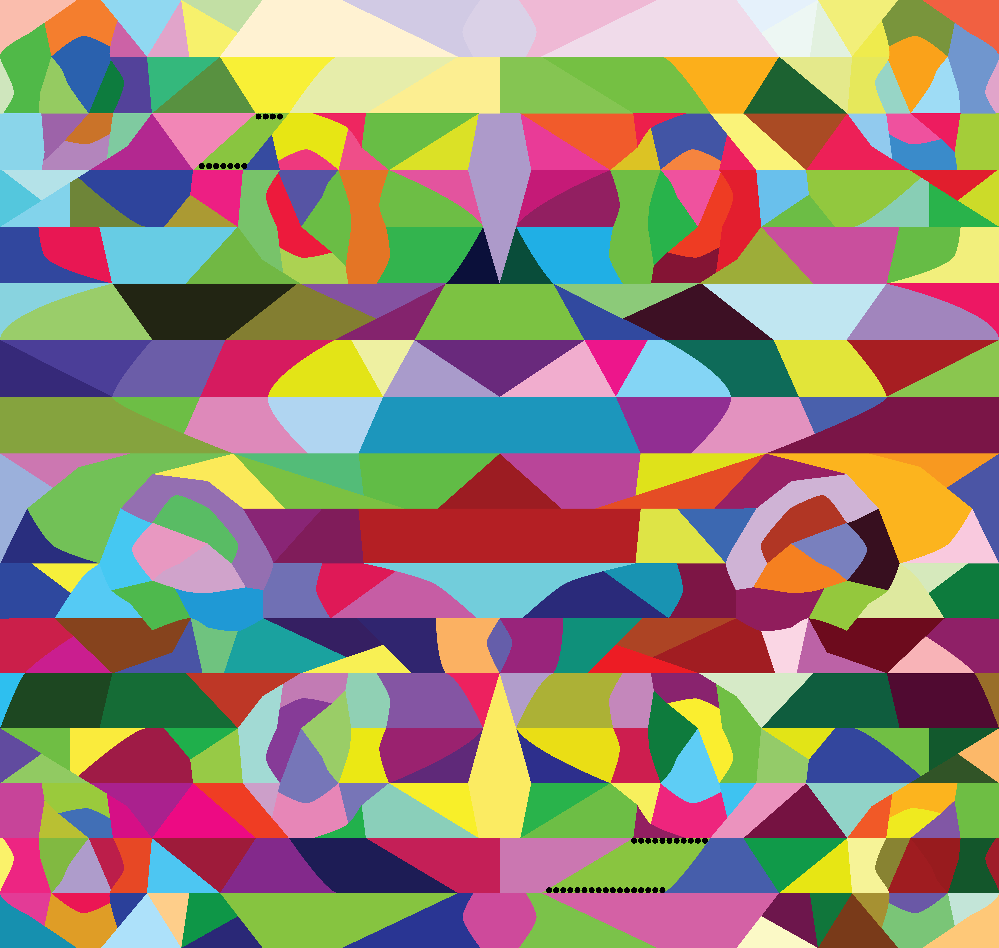

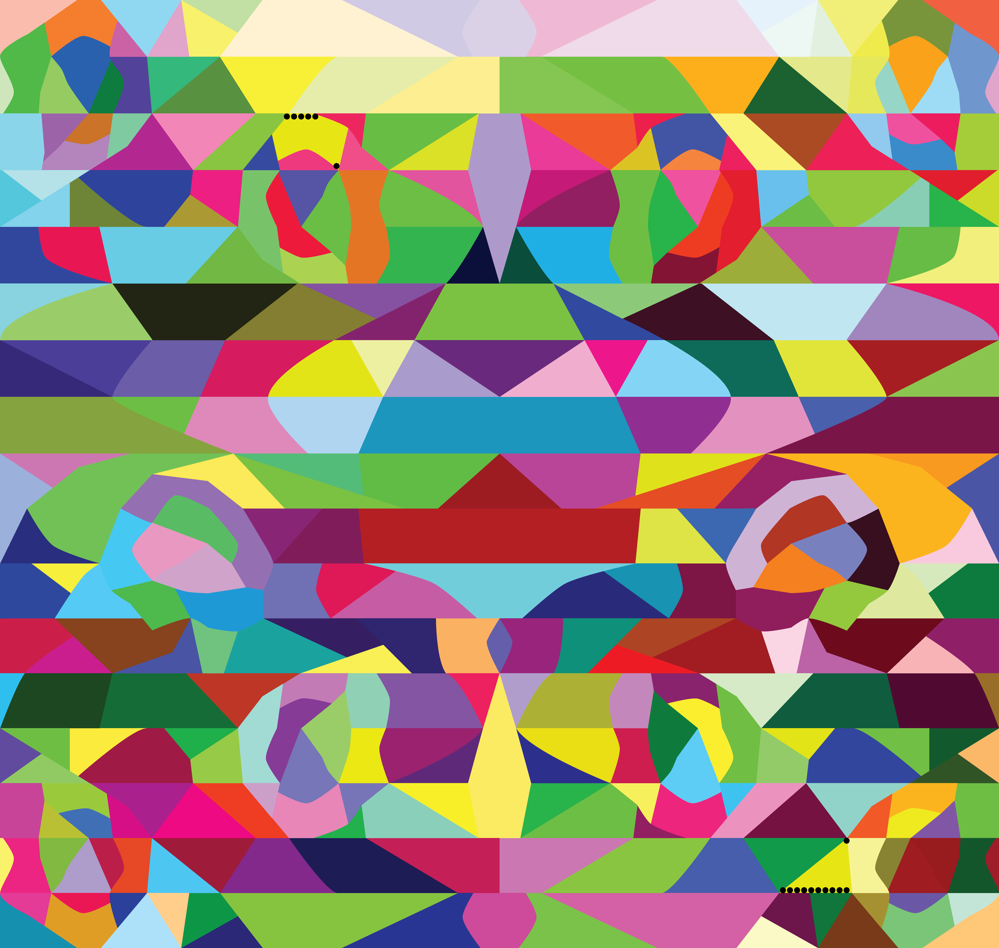

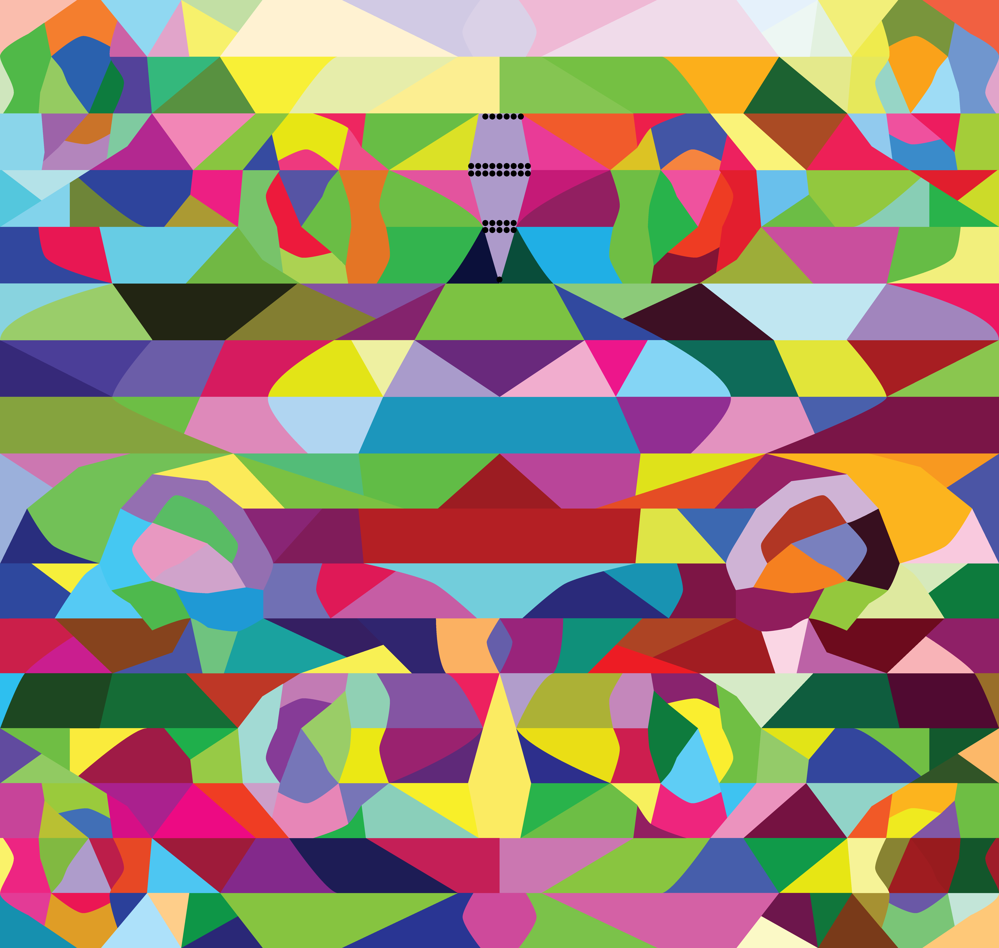

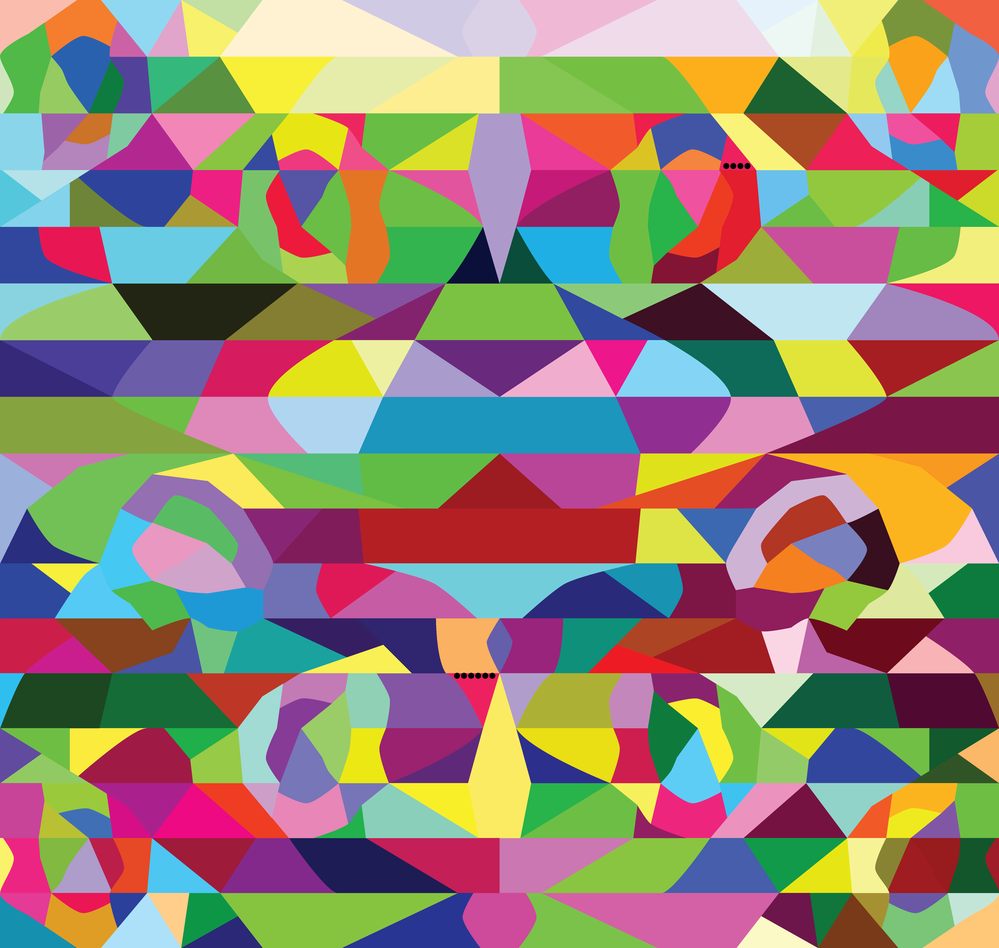

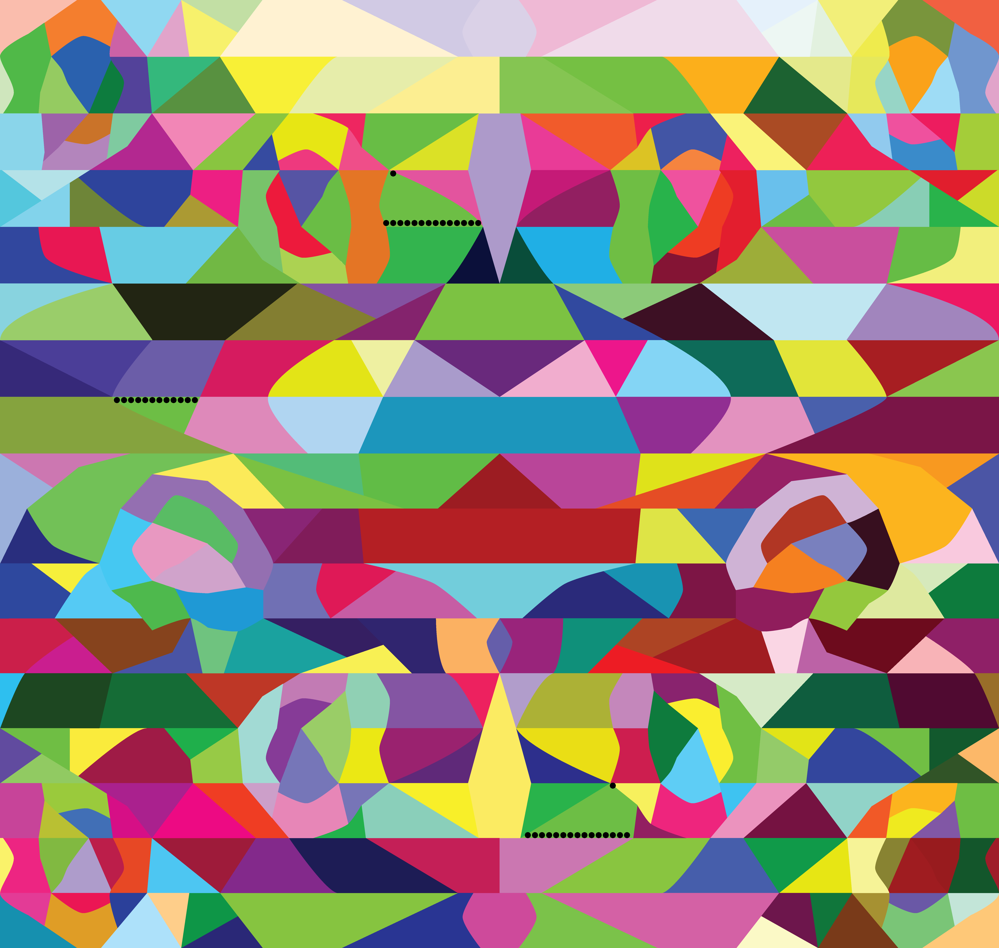

...

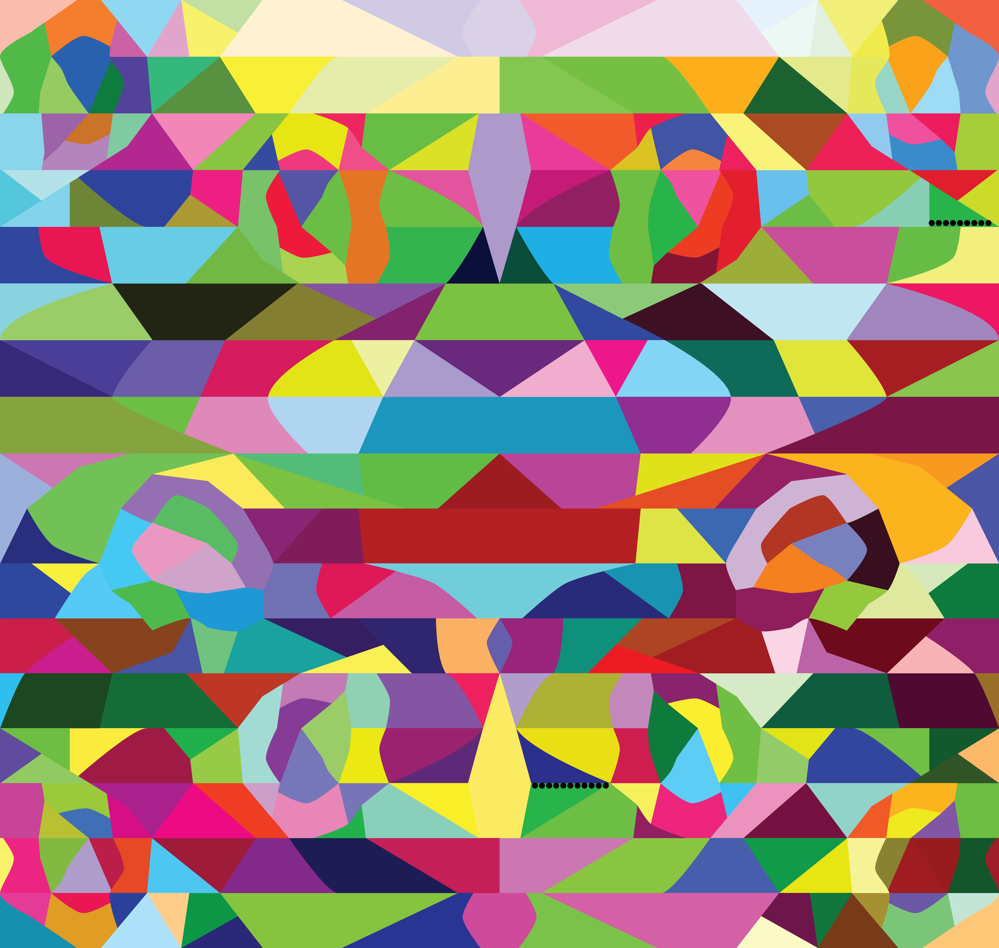

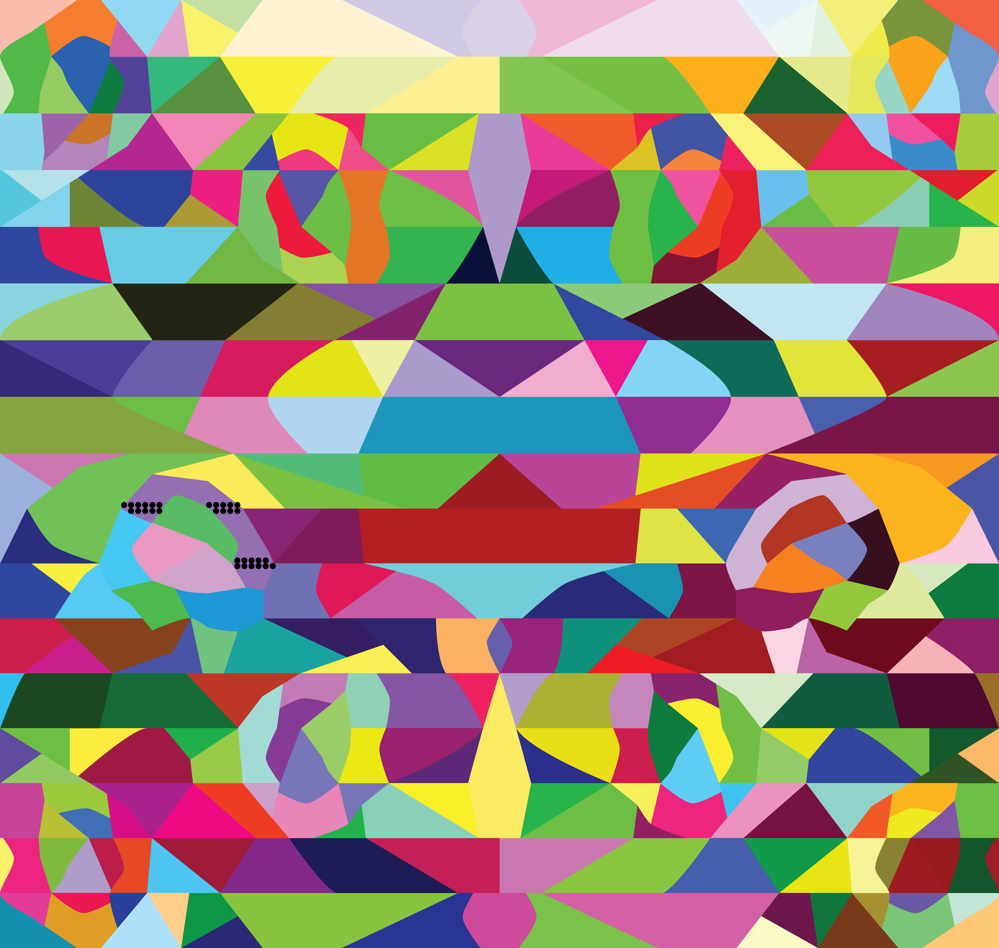

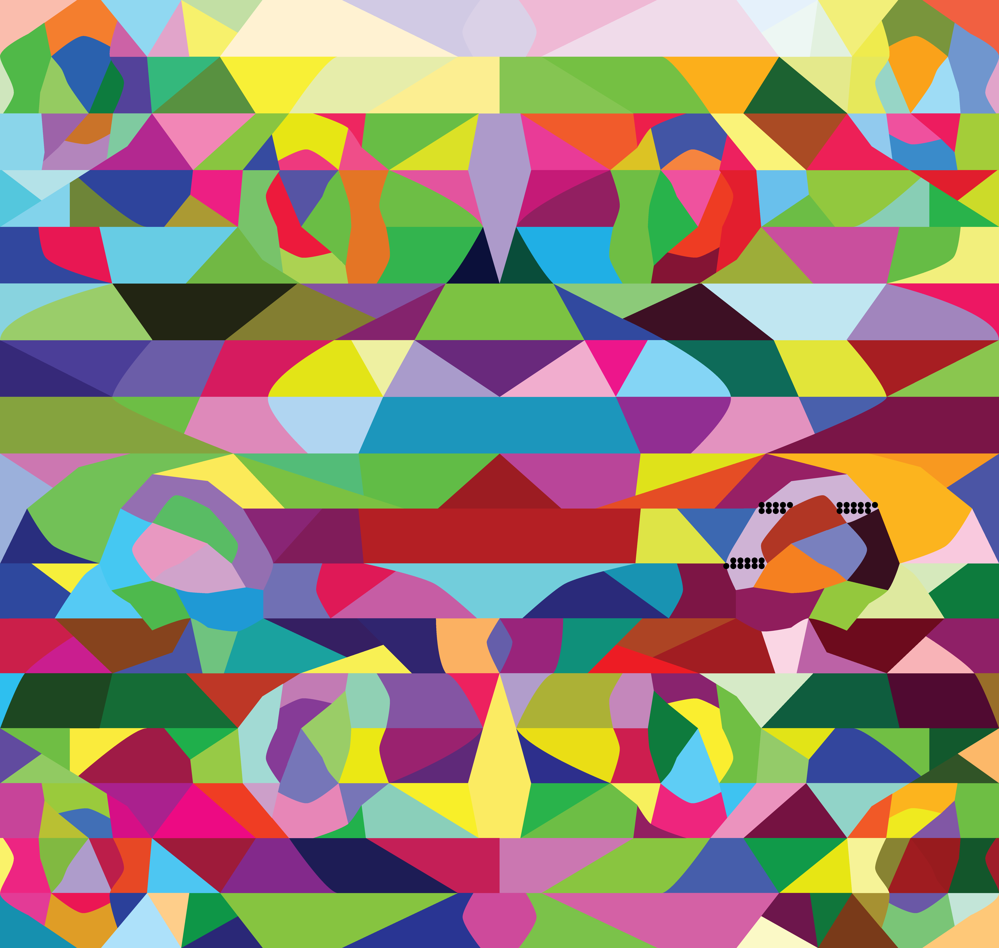

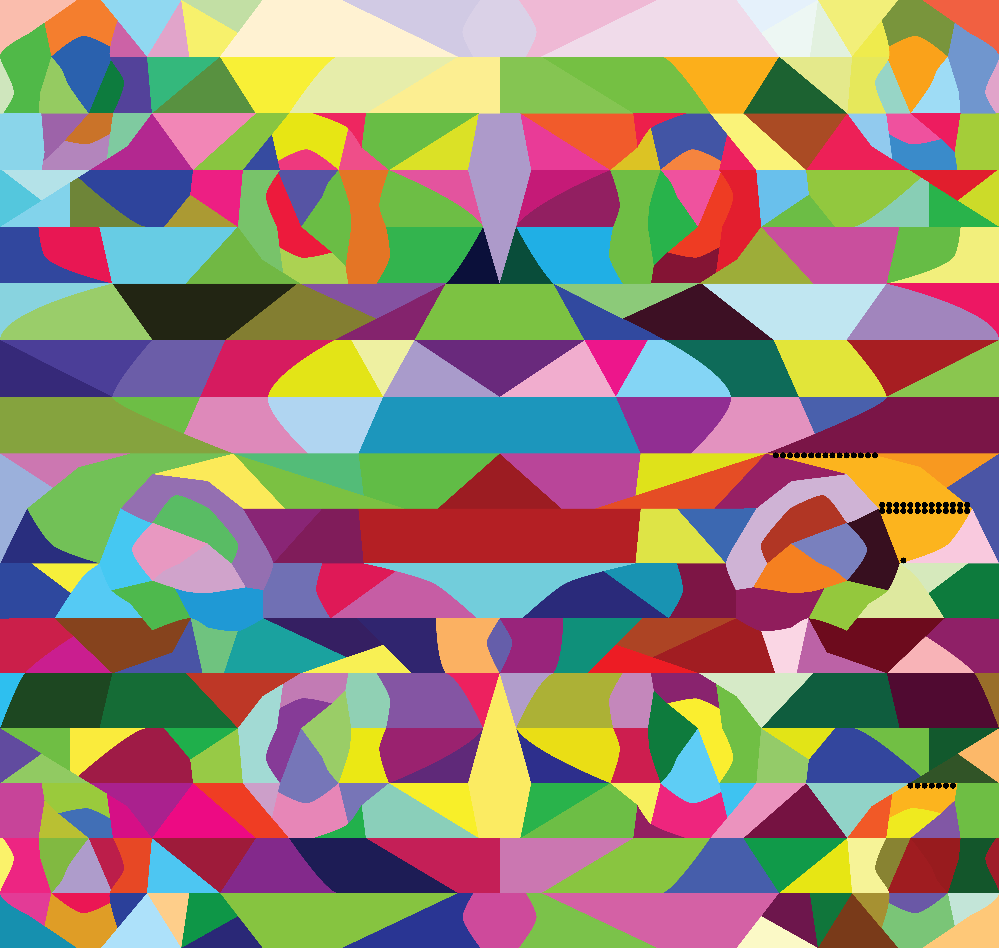

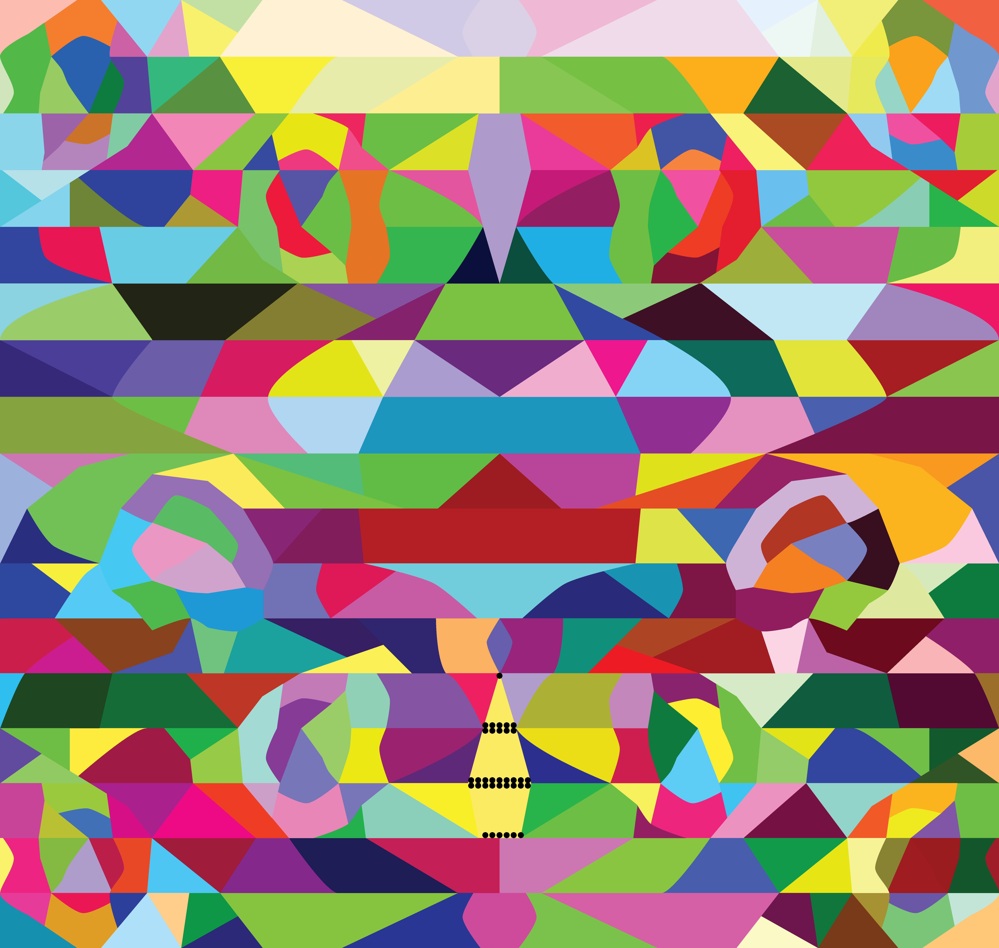

In [214]:
big = []
for poly, points in ids.items():
    if max(map(lambda x: abs(x-points[0]), points)) > 600:
        print(points[0])
        big.append(ids[poly])

cm = plt.get_cmap('Set2')
for i, poly in enumerate(big):
    leds = Image.new(design.mode, (design.width, design.height), color=(0,0,0,0))
    draw = ImageDraw.Draw(leds)
    color = tuple([int(x * 255) for x in cm.colors[i % len(cm.colors)]])

    for point in poly:
        x, y = led_coord[point]
        draw.ellipse([x-20, y-20, x+20, y+20], fill=(0,0,0))
    
    display(Image.alpha_composite(design, leds))
    

# Java constructs

In [113]:
# Emit java code encoding the polygons

for poly, points in enumerate(ids.values()):
    print("{" + ",".join([str(x) for x in points]) + "},")

{0,1,2,3,4,5,6,7,8,9,292,293,294,295,296,297,298,299},
{10,11,12,13,14,283},
{15,16,17,18,19,20,21,22,23,24,270},
{25,264,265,266,267,268,269,442,443,444,445,446,447,448,449,450},
{26,27,28,29,30,31,32,33,34,35,36},
{37,38,39,40,41,42,43,44,45,46,47,48,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259},
{49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,225,226,227},
{67,68,69,70,71,72,73,216,217,218,219,220,221,222,223,224},
{74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,213,214,215},
{92,93,94,95,96,97,98,99,100,101,102,103,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212},
{104,105,106,107,108,109,110,111,112,113,114},
{115,171,172,173,174,175,176},
{116,117,118,119,120,121,122,123,124,125,170},
{126,127,128,129,130,157},
{131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148},
{149,150,151,152,153,

In [169]:
for poly, n in enumerate(neighbour_ids):
    print("{" + ",".join([str(x) for x in n]) + "},")

{1,22,21},
{21,22,0,2},
{21,24,25,1,20,3},
{25,15,4,19,2},
{26,25,5,3},
{26,6,4,19,27},
{28,5,7,27},
{28,29,6,8},
{29,9,7,30},
{18,8,10,30,31},
{11,9,33,31},
{18,12,33,10},
{11,34,33,17,13,16},
{15,14,12,16},
{16,15,13},
{61,35,60,13,3},
{35,60,34,17,59,13,36},
{16,12},
{9,11},
{5,3},
{2,21},
{42,24,23,1,38,20,41},
{23,1,40,39,41},
{41,22,21},
{21,25,38,20,43},
{24,26,44,45,37,3},
{25,45,5,47,46,27,48,37},
{26,28,49,5,48},
{29,50,49,6,5,51,7,27},
{28,51,9,8,7,30,52,66},
{29,53,9,52,31},
{55,56,9,30,54,53,32},
{56,11,18,9,33,31},
{56,11,34,32},
{33,17,36,16,58},
{60,16,15},
{16,17,34},
{26,25,5,19,3},
{24,21,20},
{22},
{23,72,22,39,70,41},
{42,40,72},
{73,72,41,43},
{42,44,73},
{24,25,73,45,38,37,70,43},
{44,73,75,46,74,37},
{82,315,76,69,45,47,295,75,79,37,294},
{276,76,275,296,317,67,295,46,27,48,302,68},
{78,76,49,47},
{28,78,50,80,67,51,48},
{28,49,51},
{119,28,29,82,81,111,110,50,80,103,104,79,52,66},
{29,81,66,53,51,65,83},
{85,54,52,83},
{55,64,85,65,30,53},
{56,86,63,85,54,32},


In [ ]:
nei